In [1]:
import sys
import tensorflow as tf
sys.path.append("/visuworks/Blindless_AIFFELTON/Models")

# import customized modules
import preprocess, data_generator, check_result, metrics, loss, train

sys.path.append("/visuworks/Blindless_AIFFELTON/Models/FR_Unet")
import fr_unet

# Insert Path
# {model_name}_{epoch}ep_{model_inpusize}_{Generator | aG/fG/sG}
FILE_NAME = 'fr_unet_30ep_128_cG'
INPUT_SHAPE = (128, 128, 1)
MODEL_PATH = "/visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/" + FILE_NAME + ".tf"
HISTORY_PATH = "/visuworks/Blindless_AIFFELTON/Models/FR_Unet/history/" + FILE_NAME + '_history' ".json"
SOURCE = '/visuworks/Dataset/Selected Dataset 2'

2024-01-29 01:42:29.557761: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-29 01:42:29.557787: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-29 01:42:29.558827: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-29 01:42:29.564093: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-29 01:42:30.139660: W tensorflow/compiler/tf2

In [2]:
# Define custom objects for loading the model
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy}


# Create augmentation
train_preproc = preprocess.build_augmentation_for_adaptive()
test_preproc = preprocess.build_augmentation_for_adaptive(is_train=False)

# Create train, test generator
train_generator = data_generator.RandomlyCropGeneraor(
    SOURCE, 
    number_of_images=1,
    input_size=INPUT_SHAPE,
    is_train=True,
    augmentation= train_preproc
)

test_generator = data_generator.RandomlyCropGeneraor(
    SOURCE, 
    number_of_images=1,
    input_size=INPUT_SHAPE,
    is_train=False,
    augmentation= test_preproc
)

# Create model
model = fr_unet.FR_UNet(num_classes=1, feature_scale=2, dropout=0.2, fuse=True, out_ave=True)

# # Input shape
input_shape = (128, 128, 1)

# # Build the model with the specified input shape
model.build(input_shape=(None, *input_shape))

# # Display the model summary
model.summary()

2024-01-29 01:42:31.296095: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-29 01:42:31.328512: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-29 01:42:31.328715: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Model: "fr_u_net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block (Block)               multiple                  23648     
                                                                 
 block_1 (Block)             multiple                  42496     
                                                                 
 block_2 (Block)             multiple                  81408     
                                                                 
 block_3 (Block)             multiple                  81408     
                                                                 
 block_4 (Block)             multiple                  81408     
                                                                 
 block_5 (Block)             multiple                  37120     
                                                                 
 block_6 (Block)             multiple                  371

In [3]:
train.model_train(model,
                  epoch = 30,
                  train_generator = train_generator,
                  test_generator = test_generator,
                  model_path = MODEL_PATH,
                  history_path = HISTORY_PATH,
                  save_every_epoch=True,
                  apply_weight_decay=True)


Epoch 00001: WeightDecayScheduler setting learning rate to 9.999899747381279e-05.
Epoch 1/30


2024-01-28 18:53:40.467961: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infr_u_net/block/conv_block/sequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-01-28 18:53:41.844841: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-01-28 18:53:45.311487: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f09561c73b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-01-28 18:53:45.311514: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3080 Ti, Compute Capability 8.6
2024-01-28 18:53:45.316319: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1706468025.385442  368290 device_compiler.h:1

1176/1177 [============================>.] - ETA: 0s - loss: 0.6259 - sensitivity: 0.5083 - specificity: 0.9151 - accuracy: 0.8875WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/30--0.6257-0.5084-0.9151-0.4497-0.9461.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/30--0.6257-0.5084-0.9151-0.4497-0.9461.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/30--0.6257-0.5084-0.9151-0.4497-0.9461.pb
1177/1177 [==============================] - 374s 294ms/step - loss: 0.6257 - sensitivity: 0.5084 - specificity: 0.9151 - accuracy: 0.8875 - val_loss: 0.6329 - val_sensitivity: 0.4497 - val_specificity: 0.9461 - val_accuracy: 0.9198

Epoch 00002: WeightDecayScheduler setting learning rate to 9.99980006775877e-05.
Epoch 2/30
1176/1177 [============================>.] - ETA: 0s - loss: 0.5371 - sensitivity: 0.5186 - specificity: 0.9560 - accuracy: 0.9289WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/31--0.5369-0.5187-0.9560-0.4433-0.9788.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/31--0.5369-0.5187-0.9560-0.4433-0.9788.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/31--0.5369-0.5187-0.9560-0.4433-0.9788.pb
1177/1177 [==============================] - 339s 288ms/step - loss: 0.5369 - sensitivity: 0.5187 - specificity: 0.9560 - accuracy: 0.9289 - val_loss: 0.4999 - val_sensitivity: 0.4433 - val_specificity: 0.9788 - val_accuracy: 0.9454

Epoch 00003: WeightDecayScheduler setting learning rate to 9.999700388136262e-05.
Epoch 3/30
1177/1177 [==============================] - ETA: 0s - loss: 0.5092 - sensitivity: 0.5267 - specificity: 0.9618 - accuracy: 0.9355WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/32--0.5092-0.5267-0.9618-0.5060-0.9572.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/32--0.5092-0.5267-0.9618-0.5060-0.9572.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/32--0.5092-0.5267-0.9618-0.5060-0.9572.pb
1177/1177 [==============================] - 333s 283ms/step - loss: 0.5092 - sensitivity: 0.5267 - specificity: 0.9618 - accuracy: 0.9355 - val_loss: 0.5407 - val_sensitivity: 0.5060 - val_specificity: 0.9572 - val_accuracy: 0.9320

Epoch 00004: WeightDecayScheduler setting learning rate to 9.999600708513754e-05.
Epoch 4/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4731 - sensitivity: 0.5578 - specificity: 0.9649 - accuracy: 0.9379WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/33--0.4731-0.5578-0.9649-0.4842-0.9670.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/33--0.4731-0.5578-0.9649-0.4842-0.9670.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/33--0.4731-0.5578-0.9649-0.4842-0.9670.pb
1177/1177 [==============================] - 343s 292ms/step - loss: 0.4731 - sensitivity: 0.5578 - specificity: 0.9649 - accuracy: 0.9379 - val_loss: 0.5139 - val_sensitivity: 0.4842 - val_specificity: 0.9670 - val_accuracy: 0.9424

Epoch 00005: WeightDecayScheduler setting learning rate to 9.999501028891246e-05.
Epoch 5/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4613 - sensitivity: 0.5690 - specificity: 0.9674 - accuracy: 0.9428WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/34--0.4613-0.5690-0.9674-0.4629-0.9761.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/34--0.4613-0.5690-0.9674-0.4629-0.9761.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/34--0.4613-0.5690-0.9674-0.4629-0.9761.pb
1177/1177 [==============================] - 336s 286ms/step - loss: 0.4613 - sensitivity: 0.5690 - specificity: 0.9674 - accuracy: 0.9428 - val_loss: 0.4891 - val_sensitivity: 0.4629 - val_specificity: 0.9761 - val_accuracy: 0.9487

Epoch 00006: WeightDecayScheduler setting learning rate to 9.999401349268737e-05.
Epoch 6/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4545 - sensitivity: 0.5629 - specificity: 0.9681 - accuracy: 0.9443WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/35--0.4545-0.5629-0.9681-0.5485-0.9657.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/35--0.4545-0.5629-0.9681-0.5485-0.9657.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/35--0.4545-0.5629-0.9681-0.5485-0.9657.pb
1177/1177 [==============================] - 335s 285ms/step - loss: 0.4545 - sensitivity: 0.5629 - specificity: 0.9681 - accuracy: 0.9443 - val_loss: 0.4711 - val_sensitivity: 0.5485 - val_specificity: 0.9657 - val_accuracy: 0.9466

Epoch 00007: WeightDecayScheduler setting learning rate to 9.999301669646229e-05.
Epoch 7/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4496 - sensitivity: 0.5675 - specificity: 0.9692 - accuracy: 0.9463WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/36--0.4496-0.5675-0.9692-0.5312-0.9686.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/36--0.4496-0.5675-0.9692-0.5312-0.9686.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/36--0.4496-0.5675-0.9692-0.5312-0.9686.pb
1177/1177 [==============================] - 334s 284ms/step - loss: 0.4496 - sensitivity: 0.5675 - specificity: 0.9692 - accuracy: 0.9463 - val_loss: 0.4922 - val_sensitivity: 0.5312 - val_specificity: 0.9686 - val_accuracy: 0.9510

Epoch 00008: WeightDecayScheduler setting learning rate to 9.999201990023722e-05.
Epoch 8/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4351 - sensitivity: 0.5778 - specificity: 0.9697 - accuracy: 0.9461WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/37--0.4351-0.5778-0.9697-0.5266-0.9598.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/37--0.4351-0.5778-0.9697-0.5266-0.9598.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/37--0.4351-0.5778-0.9697-0.5266-0.9598.pb
1177/1177 [==============================] - 335s 284ms/step - loss: 0.4351 - sensitivity: 0.5778 - specificity: 0.9697 - accuracy: 0.9461 - val_loss: 0.4971 - val_sensitivity: 0.5266 - val_specificity: 0.9598 - val_accuracy: 0.9416

Epoch 00009: WeightDecayScheduler setting learning rate to 9.999102310401214e-05.
Epoch 9/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4446 - sensitivity: 0.5739 - specificity: 0.9696 - accuracy: 0.9476WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/38--0.4446-0.5739-0.9696-0.5137-0.9727.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/38--0.4446-0.5739-0.9696-0.5137-0.9727.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/38--0.4446-0.5739-0.9696-0.5137-0.9727.pb
1177/1177 [==============================] - 335s 285ms/step - loss: 0.4446 - sensitivity: 0.5739 - specificity: 0.9696 - accuracy: 0.9476 - val_loss: 0.4632 - val_sensitivity: 0.5137 - val_specificity: 0.9727 - val_accuracy: 0.9510

Epoch 00010: WeightDecayScheduler setting learning rate to 9.999002630778705e-05.
Epoch 10/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4283 - sensitivity: 0.5837 - specificity: 0.9707 - accuracy: 0.9483WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/39--0.4283-0.5837-0.9707-0.4995-0.9775.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/39--0.4283-0.5837-0.9707-0.4995-0.9775.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/39--0.4283-0.5837-0.9707-0.4995-0.9775.pb
1177/1177 [==============================] - 332s 282ms/step - loss: 0.4283 - sensitivity: 0.5837 - specificity: 0.9707 - accuracy: 0.9483 - val_loss: 0.4511 - val_sensitivity: 0.4995 - val_specificity: 0.9775 - val_accuracy: 0.9528

Epoch 00011: WeightDecayScheduler setting learning rate to 9.998902951156197e-05.
Epoch 11/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4428 - sensitivity: 0.5652 - specificity: 0.9720 - accuracy: 0.9505WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/40--0.4428-0.5652-0.9720-0.5084-0.9559.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/40--0.4428-0.5652-0.9720-0.5084-0.9559.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/40--0.4428-0.5652-0.9720-0.5084-0.9559.pb
1177/1177 [==============================] - 334s 284ms/step - loss: 0.4428 - sensitivity: 0.5652 - specificity: 0.9720 - accuracy: 0.9505 - val_loss: 0.5092 - val_sensitivity: 0.5084 - val_specificity: 0.9559 - val_accuracy: 0.9345

Epoch 00012: WeightDecayScheduler setting learning rate to 9.998803271533689e-05.
Epoch 12/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4315 - sensitivity: 0.5792 - specificity: 0.9714 - accuracy: 0.9496WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/41--0.4315-0.5792-0.9714-0.5580-0.9709.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/41--0.4315-0.5792-0.9714-0.5580-0.9709.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/41--0.4315-0.5792-0.9714-0.5580-0.9709.pb
1177/1177 [==============================] - 334s 284ms/step - loss: 0.4315 - sensitivity: 0.5792 - specificity: 0.9714 - accuracy: 0.9496 - val_loss: 0.4291 - val_sensitivity: 0.5580 - val_specificity: 0.9709 - val_accuracy: 0.9496

Epoch 00013: WeightDecayScheduler setting learning rate to 9.99870359191118e-05.
Epoch 13/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4361 - sensitivity: 0.5740 - specificity: 0.9716 - accuracy: 0.9505WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/42--0.4361-0.5740-0.9716-0.5184-0.9749.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/42--0.4361-0.5740-0.9716-0.5184-0.9749.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/42--0.4361-0.5740-0.9716-0.5184-0.9749.pb
1177/1177 [==============================] - 336s 286ms/step - loss: 0.4361 - sensitivity: 0.5740 - specificity: 0.9716 - accuracy: 0.9505 - val_loss: 0.4511 - val_sensitivity: 0.5184 - val_specificity: 0.9749 - val_accuracy: 0.9511

Epoch 00014: WeightDecayScheduler setting learning rate to 9.998603912288672e-05.
Epoch 14/30
1176/1177 [============================>.] - ETA: 0s - loss: 0.4243 - sensitivity: 0.5829 - specificity: 0.9718 - accuracy: 0.9502WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/43--0.4242-0.5830-0.9718-0.5478-0.9712.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/43--0.4242-0.5830-0.9718-0.5478-0.9712.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/43--0.4242-0.5830-0.9718-0.5478-0.9712.pb
1177/1177 [==============================] - 347s 294ms/step - loss: 0.4242 - sensitivity: 0.5830 - specificity: 0.9718 - accuracy: 0.9502 - val_loss: 0.4546 - val_sensitivity: 0.5478 - val_specificity: 0.9712 - val_accuracy: 0.9526

Epoch 00015: WeightDecayScheduler setting learning rate to 9.998504232666165e-05.
Epoch 15/30
1176/1177 [============================>.] - ETA: 0s - loss: 0.4296 - sensitivity: 0.5773 - specificity: 0.9721 - accuracy: 0.9518WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/44--0.4296-0.5775-0.9720-0.6158-0.9618.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/44--0.4296-0.5775-0.9720-0.6158-0.9618.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/44--0.4296-0.5775-0.9720-0.6158-0.9618.pb
1177/1177 [==============================] - 335s 285ms/step - loss: 0.4296 - sensitivity: 0.5775 - specificity: 0.9720 - accuracy: 0.9518 - val_loss: 0.4257 - val_sensitivity: 0.6158 - val_specificity: 0.9618 - val_accuracy: 0.9463

Epoch 00016: WeightDecayScheduler setting learning rate to 9.998404553043657e-05.
Epoch 16/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4204 - sensitivity: 0.5945 - specificity: 0.9732 - accuracy: 0.9533WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/45--0.4204-0.5945-0.9732-0.4952-0.9801.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/45--0.4204-0.5945-0.9732-0.4952-0.9801.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/45--0.4204-0.5945-0.9732-0.4952-0.9801.pb
1177/1177 [==============================] - 337s 287ms/step - loss: 0.4204 - sensitivity: 0.5945 - specificity: 0.9732 - accuracy: 0.9533 - val_loss: 0.4561 - val_sensitivity: 0.4952 - val_specificity: 0.9801 - val_accuracy: 0.9565

Epoch 00017: WeightDecayScheduler setting learning rate to 9.998304873421149e-05.
Epoch 17/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4073 - sensitivity: 0.6008 - specificity: 0.9739 - accuracy: 0.9526WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/46--0.4073-0.6008-0.9739-0.5762-0.9692.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/46--0.4073-0.6008-0.9739-0.5762-0.9692.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/46--0.4073-0.6008-0.9739-0.5762-0.9692.pb
1177/1177 [==============================] - 344s 292ms/step - loss: 0.4073 - sensitivity: 0.6008 - specificity: 0.9739 - accuracy: 0.9526 - val_loss: 0.4373 - val_sensitivity: 0.5762 - val_specificity: 0.9692 - val_accuracy: 0.9507

Epoch 00018: WeightDecayScheduler setting learning rate to 9.99820519379864e-05.
Epoch 18/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4084 - sensitivity: 0.6012 - specificity: 0.9741 - accuracy: 0.9544WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/47--0.4084-0.6012-0.9741-0.5253-0.9727.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/47--0.4084-0.6012-0.9741-0.5253-0.9727.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/47--0.4084-0.6012-0.9741-0.5253-0.9727.pb
1177/1177 [==============================] - 339s 288ms/step - loss: 0.4084 - sensitivity: 0.6012 - specificity: 0.9741 - accuracy: 0.9544 - val_loss: 0.4689 - val_sensitivity: 0.5253 - val_specificity: 0.9727 - val_accuracy: 0.9526

Epoch 00019: WeightDecayScheduler setting learning rate to 9.998105514176132e-05.
Epoch 19/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4150 - sensitivity: 0.5876 - specificity: 0.9729 - accuracy: 0.9525WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/48--0.4150-0.5876-0.9729-0.5187-0.9734.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/48--0.4150-0.5876-0.9729-0.5187-0.9734.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/48--0.4150-0.5876-0.9729-0.5187-0.9734.pb
1177/1177 [==============================] - 330s 280ms/step - loss: 0.4150 - sensitivity: 0.5876 - specificity: 0.9729 - accuracy: 0.9525 - val_loss: 0.4563 - val_sensitivity: 0.5187 - val_specificity: 0.9734 - val_accuracy: 0.9519

Epoch 00020: WeightDecayScheduler setting learning rate to 9.998005834553624e-05.
Epoch 20/30
1176/1177 [============================>.] - ETA: 0s - loss: 0.4024 - sensitivity: 0.6066 - specificity: 0.9738 - accuracy: 0.9541WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/49--0.4024-0.6066-0.9738-0.4569-0.9805.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/49--0.4024-0.6066-0.9738-0.4569-0.9805.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/49--0.4024-0.6066-0.9738-0.4569-0.9805.pb
1177/1177 [==============================] - 337s 286ms/step - loss: 0.4024 - sensitivity: 0.6066 - specificity: 0.9738 - accuracy: 0.9541 - val_loss: 0.4833 - val_sensitivity: 0.4569 - val_specificity: 0.9805 - val_accuracy: 0.9547

Epoch 00021: WeightDecayScheduler setting learning rate to 9.997906154931117e-05.
Epoch 21/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4112 - sensitivity: 0.5992 - specificity: 0.9745 - accuracy: 0.9555WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/50--0.4112-0.5992-0.9745-0.3445-0.9884.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/50--0.4112-0.5992-0.9745-0.3445-0.9884.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/50--0.4112-0.5992-0.9745-0.3445-0.9884.pb
1177/1177 [==============================] - 340s 289ms/step - loss: 0.4112 - sensitivity: 0.5992 - specificity: 0.9745 - accuracy: 0.9555 - val_loss: 0.5560 - val_sensitivity: 0.3445 - val_specificity: 0.9884 - val_accuracy: 0.9487

Epoch 00022: WeightDecayScheduler setting learning rate to 9.997806475308608e-05.
Epoch 22/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4100 - sensitivity: 0.5945 - specificity: 0.9731 - accuracy: 0.9525WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/51--0.4100-0.5945-0.9731-0.5417-0.9651.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/51--0.4100-0.5945-0.9731-0.5417-0.9651.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/51--0.4100-0.5945-0.9731-0.5417-0.9651.pb
1177/1177 [==============================] - 335s 284ms/step - loss: 0.4100 - sensitivity: 0.5945 - specificity: 0.9731 - accuracy: 0.9525 - val_loss: 0.4583 - val_sensitivity: 0.5417 - val_specificity: 0.9651 - val_accuracy: 0.9449

Epoch 00023: WeightDecayScheduler setting learning rate to 9.9977067956861e-05.
Epoch 23/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4163 - sensitivity: 0.5894 - specificity: 0.9741 - accuracy: 0.9548WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/52--0.4163-0.5894-0.9741-0.5549-0.9718.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/52--0.4163-0.5894-0.9741-0.5549-0.9718.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/52--0.4163-0.5894-0.9741-0.5549-0.9718.pb
1177/1177 [==============================] - 338s 287ms/step - loss: 0.4163 - sensitivity: 0.5894 - specificity: 0.9741 - accuracy: 0.9548 - val_loss: 0.4371 - val_sensitivity: 0.5549 - val_specificity: 0.9718 - val_accuracy: 0.9532

Epoch 00024: WeightDecayScheduler setting learning rate to 9.997607116063592e-05.
Epoch 24/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4098 - sensitivity: 0.5959 - specificity: 0.9731 - accuracy: 0.9525WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/53--0.4098-0.5959-0.9731-0.5415-0.9732.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/53--0.4098-0.5959-0.9731-0.5415-0.9732.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/53--0.4098-0.5959-0.9731-0.5415-0.9732.pb
1177/1177 [==============================] - 332s 282ms/step - loss: 0.4098 - sensitivity: 0.5959 - specificity: 0.9731 - accuracy: 0.9525 - val_loss: 0.4506 - val_sensitivity: 0.5415 - val_specificity: 0.9732 - val_accuracy: 0.9520

Epoch 00025: WeightDecayScheduler setting learning rate to 9.997507436441083e-05.
Epoch 25/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4036 - sensitivity: 0.6034 - specificity: 0.9743 - accuracy: 0.9547WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/54--0.4036-0.6034-0.9743-0.5212-0.9737.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/54--0.4036-0.6034-0.9743-0.5212-0.9737.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/54--0.4036-0.6034-0.9743-0.5212-0.9737.pb
1177/1177 [==============================] - 326s 277ms/step - loss: 0.4036 - sensitivity: 0.6034 - specificity: 0.9743 - accuracy: 0.9547 - val_loss: 0.4566 - val_sensitivity: 0.5212 - val_specificity: 0.9737 - val_accuracy: 0.9523

Epoch 00026: WeightDecayScheduler setting learning rate to 9.997407756818575e-05.
Epoch 26/30
1177/1177 [==============================] - ETA: 0s - loss: 0.4121 - sensitivity: 0.5947 - specificity: 0.9743 - accuracy: 0.9556WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/55--0.4121-0.5947-0.9743-0.5412-0.9751.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/55--0.4121-0.5947-0.9743-0.5412-0.9751.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/55--0.4121-0.5947-0.9743-0.5412-0.9751.pb
1177/1177 [==============================] - 339s 288ms/step - loss: 0.4121 - sensitivity: 0.5947 - specificity: 0.9743 - accuracy: 0.9556 - val_loss: 0.4366 - val_sensitivity: 0.5412 - val_specificity: 0.9751 - val_accuracy: 0.9560

Epoch 00027: WeightDecayScheduler setting learning rate to 9.997308077196067e-05.
Epoch 27/30
1177/1177 [==============================] - ETA: 0s - loss: 0.3906 - sensitivity: 0.6081 - specificity: 0.9749 - accuracy: 0.9558WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/56--0.3906-0.6081-0.9749-0.4916-0.9570.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/56--0.3906-0.6081-0.9749-0.4916-0.9570.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/56--0.3906-0.6081-0.9749-0.4916-0.9570.pb
1177/1177 [==============================] - 335s 285ms/step - loss: 0.3906 - sensitivity: 0.6081 - specificity: 0.9749 - accuracy: 0.9558 - val_loss: 0.5431 - val_sensitivity: 0.4916 - val_specificity: 0.9570 - val_accuracy: 0.9376

Epoch 00028: WeightDecayScheduler setting learning rate to 9.99720839757356e-05.
Epoch 28/30
1177/1177 [==============================] - ETA: 0s - loss: 0.3970 - sensitivity: 0.6107 - specificity: 0.9739 - accuracy: 0.9544WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/57--0.3970-0.6107-0.9739-0.4985-0.9805.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/57--0.3970-0.6107-0.9739-0.4985-0.9805.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/57--0.3970-0.6107-0.9739-0.4985-0.9805.pb
1177/1177 [==============================] - 338s 288ms/step - loss: 0.3970 - sensitivity: 0.6107 - specificity: 0.9739 - accuracy: 0.9544 - val_loss: 0.4479 - val_sensitivity: 0.4985 - val_specificity: 0.9805 - val_accuracy: 0.9562

Epoch 00029: WeightDecayScheduler setting learning rate to 9.997108717951051e-05.
Epoch 29/30
1177/1177 [==============================] - ETA: 0s - loss: 0.3978 - sensitivity: 0.6085 - specificity: 0.9733 - accuracy: 0.9545WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/58--0.3978-0.6085-0.9733-0.5327-0.9705.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/58--0.3978-0.6085-0.9733-0.5327-0.9705.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/58--0.3978-0.6085-0.9733-0.5327-0.9705.pb
1177/1177 [==============================] - 343s 291ms/step - loss: 0.3978 - sensitivity: 0.6085 - specificity: 0.9733 - accuracy: 0.9545 - val_loss: 0.4576 - val_sensitivity: 0.5327 - val_specificity: 0.9705 - val_accuracy: 0.9527

Epoch 00030: WeightDecayScheduler setting learning rate to 9.997009038328543e-05.
Epoch 30/30
1177/1177 [==============================] - ETA: 0s - loss: 0.3887 - sensitivity: 0.6183 - specificity: 0.9739 - accuracy: 0.9548WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f0d4426fd90>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/59--0.3887-0.6183-0.9739-0.4760-0.9805.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/59--0.3887-0.6183-0.9739-0.4760-0.9805.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/59--0.3887-0.6183-0.9739-0.4760-0.9805.pb
1177/1177 [==============================] - 335s 285ms/step - loss: 0.3887 - sensitivity: 0.6183 - specificity: 0.9739 - accuracy: 0.9548 - val_loss: 0.4567 - val_sensitivity: 0.4760 - val_specificity: 0.9805 - val_accuracy: 0.9546


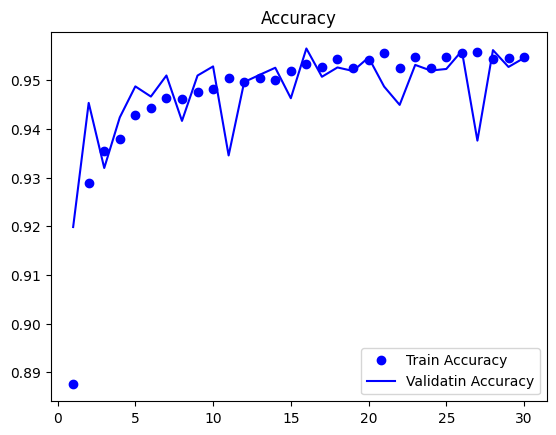

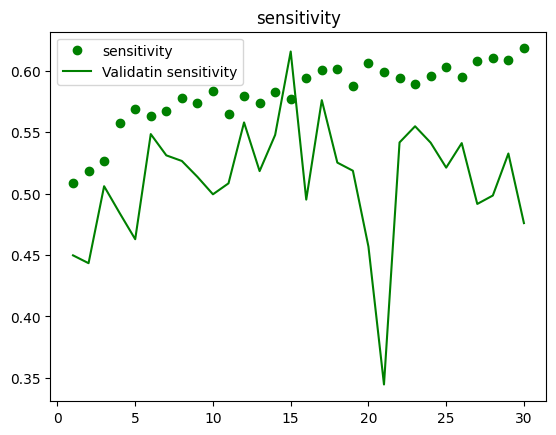

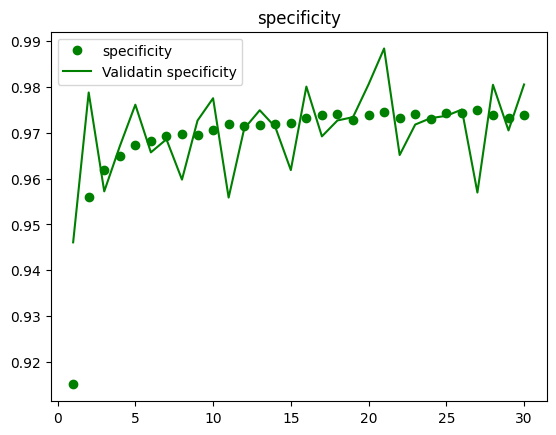

<Figure size 640x480 with 0 Axes>

In [3]:
check_result.plot_history(HISTORY_PATH)

In [3]:
MODEL_PATH = "/visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_128_cG.tf/59--0.3887-0.6183-0.9739-0.4760-0.9805.pb"
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)
metrics.print_evaluation(model, test_generator)

2024-01-29 01:42:54.135949: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904


500/500 [==============================] - 95s 183ms/step - loss: 0.4714 - sensitivity: 0.4662 - specificity: 0.9781 - accuracy: 0.9540
Loss: 0.4713679552078247
Sensitivity: 0.46624550223350525
Specificity: 0.9780780076980591
Accuracy: 0.9540426731109619


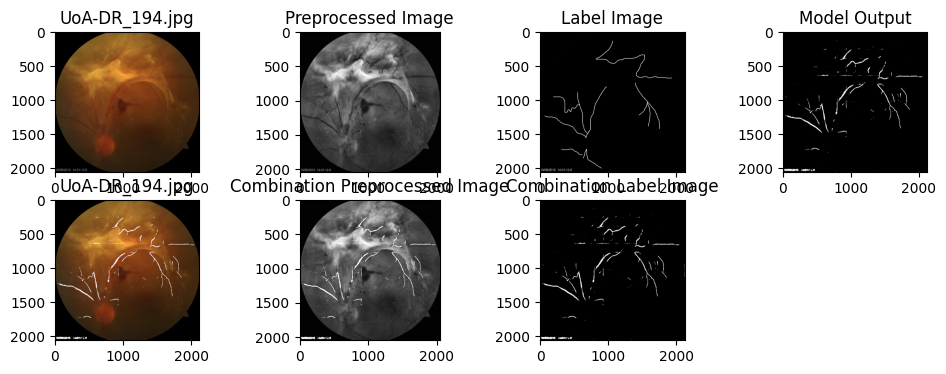

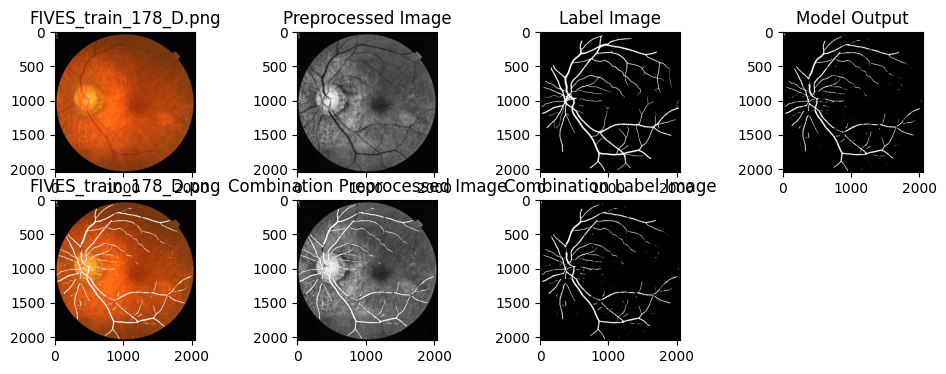

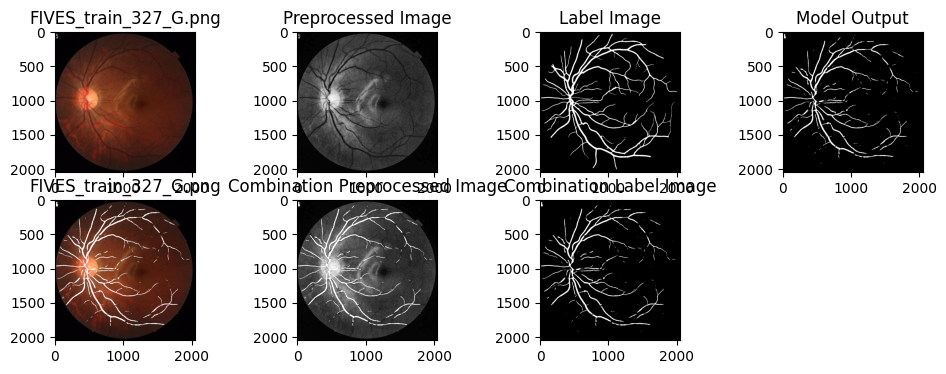

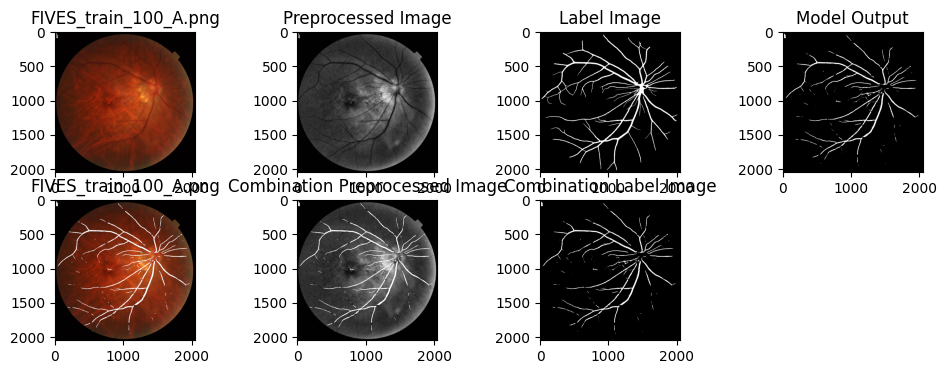

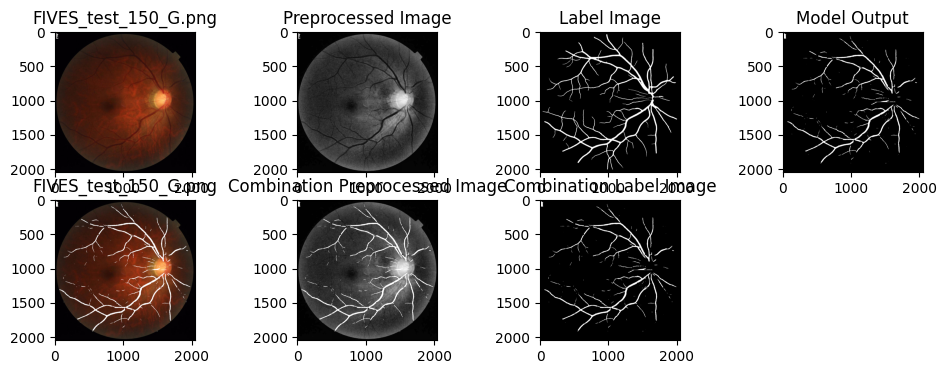

...

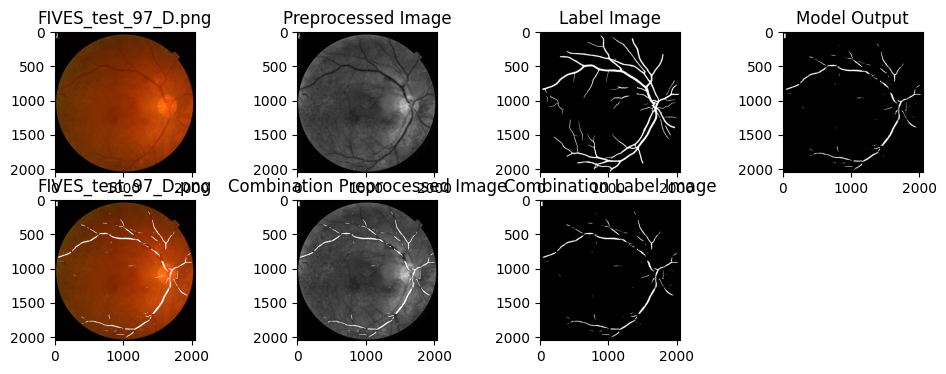

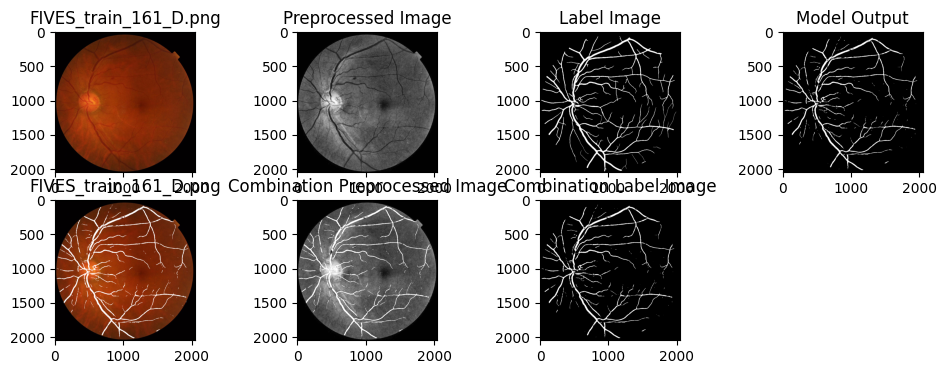

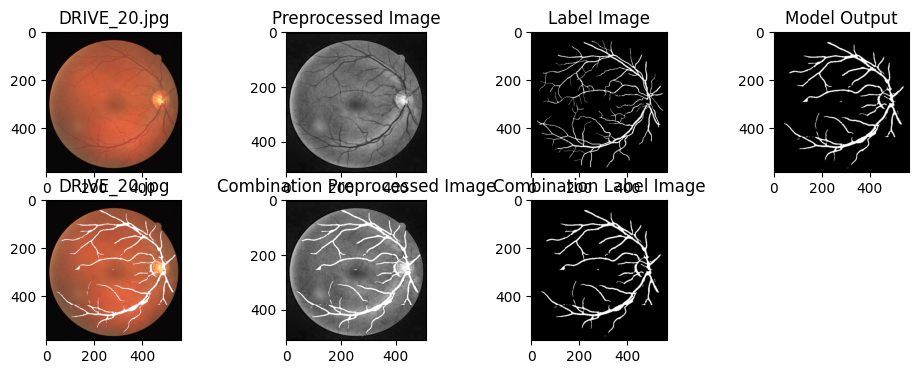

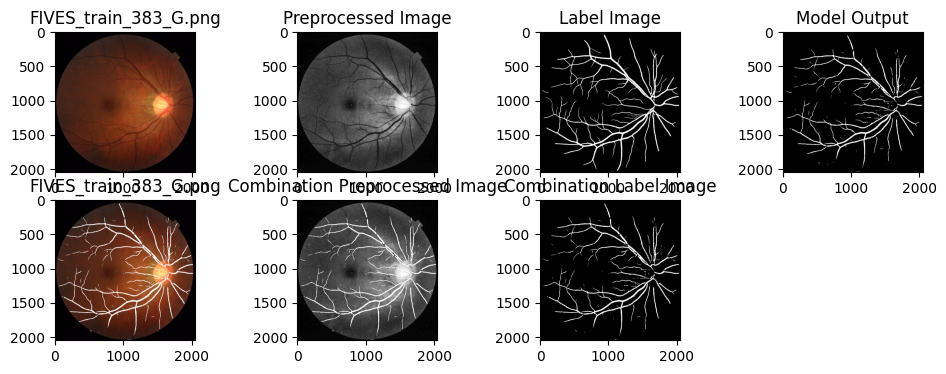

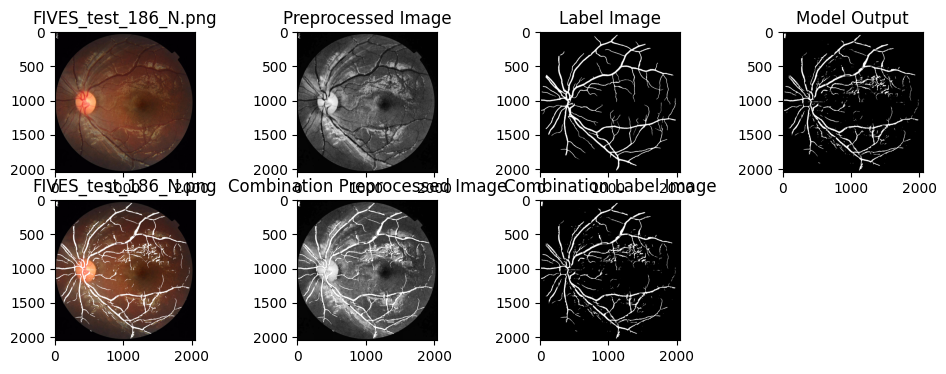

: 

In [4]:
# Plot model result
num_images_to_select = 50
check_result.visualize_AG_result(model, num_images_to_select, SOURCE, INPUT_SHAPE)